# Introduction

In the routing stage of back-end design in very large-scale integrated computer-aided design (VLSI CAD), congestion is used to evaluate routing performance. Congestion happens when the routing demand exceeds the routing resources available in a region. A route-friendly design is usually obtained through a routability estimator that provides congestion feedback to guide the kernel placer minimizing for placement objectives. We propose using a diffusion model to capture designs’ feature distributions to generate possible variations that might help further optimize placements for routability.

The research was started by using a full-fledged model [15] proposed by Nichol et al. from OpenAI. After many rounds of minor modifications, we found we simply did not have enough computing power to use that industrial high-precision model. Then we proceeded with a simple diffusion model based on [10]–[12] instead to determine whether diffusion models can capture VLSI design features. 

# Dataset 
CircuitNet, proposed by Chai et al., is an open-source dataset that was originally created for cross-stage prediction tasks in back-end design [7]. It has collected 10,242 layouts based on open-source RISC-V designs. They first collected the data from both the logic synthesis stage and the physical design stage and then extracted the features from various design stages. (Details are in Figure 6 in Appendix.) By dividing each layout into tiles and taking each tile as a pixel based on tiles of size 1.5 μm× 1.5 μm [7], the design information on layouts is represented by image-like features maps. While CircuitNet provides 10,242 layouts for congestion prediction tasks, in this research, as we are not aiming for high-precision results with a simple diffusion model, we only use 7,078 of them for faster experimenting.
# Input features 
In the research by Liu et al., they chose RUDY, PinRUDY, and MacroRegion (Details of their respective computation can be seen in [6]) from cell placement solutions to compose the M × N× 3 feature map as the input for their congestion prediction model [6]. In this research, we keep their choices.  
	RUDY: based on a Rectangular Uniform wire DensitY for each net [20], a fast, accurate routing demand estimation technique that represents the routing demand of different bins in the layout with a two-dimensional map [6] (RUDY has two assumptions, and see details in [20]). 
	PinRUDY: a variation of RUDY [7].     
	MacroRegion: the region covered by macro cells, used for estimating routing resources available in a tile [7]. 




In [1]:
pip install blobfile

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 74.5/74.5 kB 3.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 42.7 MB/s eta 0:00:0000:01
Note: you may need to restart the kernel to use updated packages.


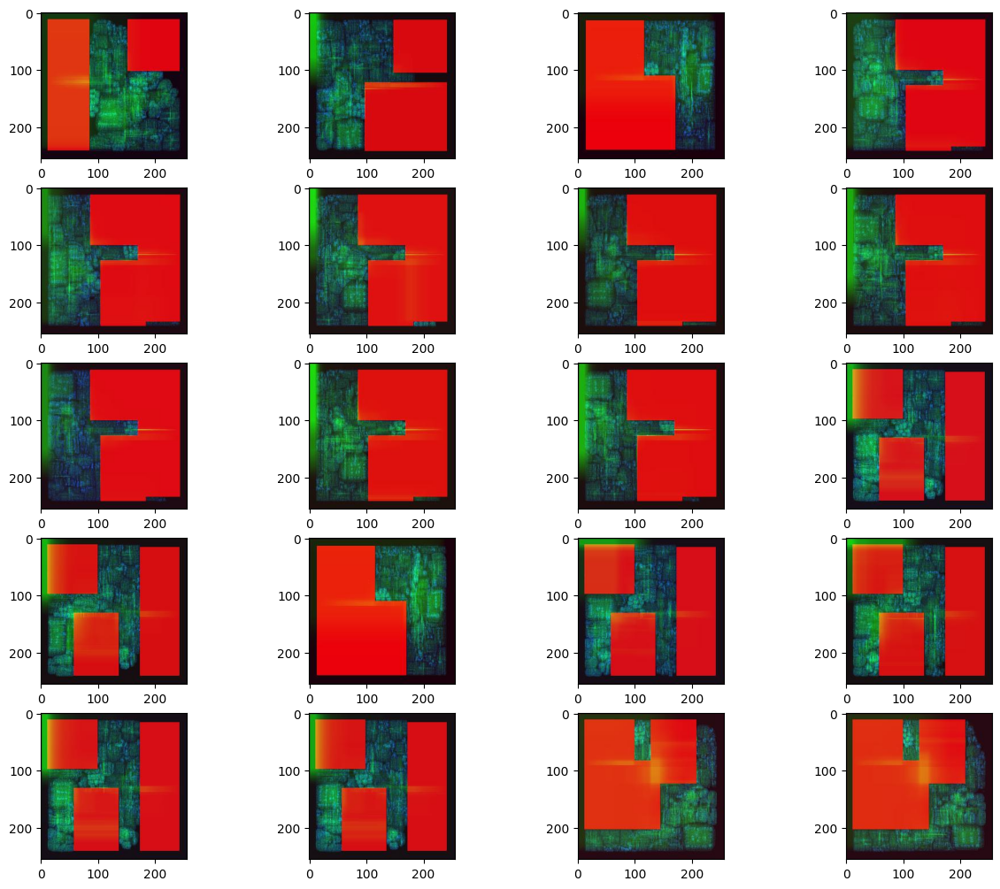

In [2]:
import torch
import torchvision
import matplotlib.pyplot as plt
import blobfile as bf
from PIL import Image

def show_images(data_set, num_samples=20, cols=4):
    """ Plots some samples from the dataset """
    plt.figure(figsize=(15,15)) 
    for i, img in enumerate(data_set):
        if i == num_samples:
            break
        plt.subplot(int(num_samples/cols) + 1, cols, i + 1)
        plt.imshow(img)

def _list_image_files_recursively(data_dir):
    results = []
    for entry in sorted(bf.listdir(data_dir)):
        full_path = bf.join(data_dir, entry)
        ext = entry.split(".")[-1]
        if "." in entry and ext.lower() in ["jpg", "jpeg", "png", "gif"]:
            with bf.BlobFile(full_path, "rb") as f:
                im = Image.open(f)
                im.load()
                results.append(im)
        elif bf.isdir(full_path):
            results.extend(_list_image_files_recursively(full_path))
    return results


data = _list_image_files_recursively("/kaggle/input/feature-riscyfpu-jpg")
show_images(data)

Later in this notebook we will do some additional modifications to this dataset, for example make the images smaller, convert them to tensors etc.

# Implementation of the simple diffusion model 
Based on [10]–[12], the implementation consists of three major components: a scheduler for the forward process that sequentially adds noise, a U-net neural network for the backward process that predicts the noise in an image, and a position embedding that encodes the current timestep t. 
In the forward process, the version of an image for any arbitrary timestep t can be directly calculated based on the initial input image x_0 without sequentially iterating through its predecessors because the sum of Gaussian distributions is still a Gaussian distribution [8]. The advantage of implementing that as the direct calculation is that it makes training more accessible as we can now take an arbitrary timestep t and pass its version of the noised image to the neural network to make the prediction. As this is a simple diffusion model, the U-net implementation only has essential components like downsampling, upsampling and residual connections. The position embedding that specifies diffusion time t is implemented as additional input upon the noisy image. 


## Step 1: The forward process = Noise scheduler




We first need to build the inputs for our model, which are more and more noisy images. Instead of doing this sequentially, we can use the closed form provided in the papers to calculate the image for any of the timesteps individually. 


- The noise-levels/variances can be pre-computed
- There are different types of variance schedules
- We can sample each timestep image independently (Sums of Gaussians is also Gaussian)
- No model is needed in this forward step

In [3]:
import torch.nn.functional as F

def linear_beta_schedule(timesteps, start=0.0001, end=0.02):
    return torch.linspace(start, end, timesteps)

def get_index_from_list(vals, t, x_shape):
    """ 
    Returns a specific index t of a passed list of values vals
    while considering the batch dimension.
    """
    batch_size = t.shape[0]
    out = vals.gather(-1, t.cpu())
    return out.reshape(batch_size, *((1,) * (len(x_shape) - 1))).to(t.device)

def forward_diffusion_sample(x_0, t, device="cpu"):
    """ 
    Takes an image and a timestep as input and 
    returns the noisy version of it
    """
    noise = torch.randn_like(x_0)
    sqrt_alphas_cumprod_t = get_index_from_list(sqrt_alphas_cumprod, t, x_0.shape)
    sqrt_one_minus_alphas_cumprod_t = get_index_from_list(
        sqrt_one_minus_alphas_cumprod, t, x_0.shape
    )
    # mean + variance
    return sqrt_alphas_cumprod_t.to(device) * x_0.to(device) \
    + sqrt_one_minus_alphas_cumprod_t.to(device) * noise.to(device), noise.to(device)


# Define beta schedule
T = 300
betas = linear_beta_schedule(timesteps=T)

# Pre-calculate different terms for closed form
alphas = 1. - betas
alphas_cumprod = torch.cumprod(alphas, axis=0)
alphas_cumprod_prev = F.pad(alphas_cumprod[:-1], (1, 0), value=1.0)
sqrt_recip_alphas = torch.sqrt(1.0 / alphas)
sqrt_alphas_cumprod = torch.sqrt(alphas_cumprod)
sqrt_one_minus_alphas_cumprod = torch.sqrt(1. - alphas_cumprod)
posterior_variance = betas * (1. - alphas_cumprod_prev) / (1. - alphas_cumprod)

Let's test it on our dataset ...

In [4]:
from torchvision import transforms 
from torch.utils.data import DataLoader
import numpy as np
import math

IMG_SIZE = 64
BATCH_SIZE = 128

num_total = len(data)

num_train_set = math.ceil(num_total*0.9)
    
def load_transformed_dataset():
    data_transforms = [
        transforms.Resize((IMG_SIZE, IMG_SIZE)),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(), # Scales data into [0,1] 
        transforms.Lambda(lambda t: (t * 2) - 1) # Scale between [-1, 1] 
    ]
    transform = transforms.Compose(data_transforms)

    data_trans = []
    for im in data:
        im_trans = transform(im)
        data_trans.append(im_trans)
    
    train = data_trans[:num_train_set]
    test = data_trans[num_train_set:]
    
    return torch.utils.data.ConcatDataset([train, test])
def show_tensor_image(image):
    reverse_transforms = transforms.Compose([
        transforms.Lambda(lambda t: (t + 1) / 2),
        transforms.Lambda(lambda t: t.permute(1, 2, 0)), # CHW to HWC
        transforms.Lambda(lambda t: t * 255.),
        transforms.Lambda(lambda t: t.numpy().astype(np.uint8)),
        transforms.ToPILImage(),
    ])

    # Take first image of batch
    if len(image.shape) == 4:
        image = image[0, :, :, :] 
    plt.imshow(reverse_transforms(image))

data_ = load_transformed_dataset()
dataloader = DataLoader(data_, batch_size=BATCH_SIZE, shuffle=True, drop_last=True)

/tmp/ipykernel_31/1217489402.py:11: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, num_images+1, int(idx/stepsize) + 1)


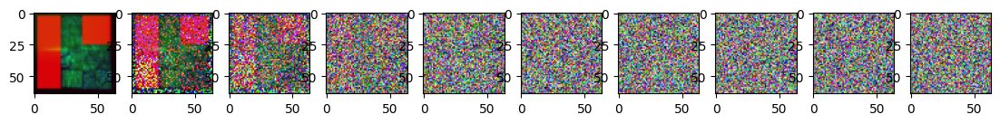

In [5]:
# Simulate forward diffusion
image = next(iter(dataloader))[0]

plt.figure(figsize=(15,15))
plt.axis('off')
num_images = 10
stepsize = int(T/num_images)

for idx in range(0, T, stepsize):
    t = torch.Tensor([idx]).type(torch.int64)
    plt.subplot(1, num_images+1, int(idx/stepsize) + 1)
    image, noise = forward_diffusion_sample(image, t)
    show_tensor_image(image)

## Step 2: The backward process = U-Net



An introduction to UNets: https://amaarora.github.io/2020/09/13/unet.html.



- We use a simple form of a UNet for to predict the noise in the image
- The input is a noisy image, the ouput the noise in the image
- Because the parameters are shared accross time, we need to tell the network in which timestep we are
- The Timestep is encoded by the transformer Sinusoidal Embedding
- We output one single value (mean), because the variance is fixed


In [6]:
from torch import nn
import math


class Block(nn.Module):
    def __init__(self, in_ch, out_ch, time_emb_dim, up=False):
        super().__init__()
        self.time_mlp =  nn.Linear(time_emb_dim, out_ch)
        if up:
            self.conv1 = nn.Conv2d(2*in_ch, out_ch, 3, padding=1)
            self.transform = nn.ConvTranspose2d(out_ch, out_ch, 4, 2, 1)
        else:
            self.conv1 = nn.Conv2d(in_ch, out_ch, 3, padding=1)
            self.transform = nn.Conv2d(out_ch, out_ch, 4, 2, 1)
        self.conv2 = nn.Conv2d(out_ch, out_ch, 3, padding=1)
        self.bnorm1 = nn.BatchNorm2d(out_ch)
        self.bnorm2 = nn.BatchNorm2d(out_ch)
        self.relu  = nn.ReLU()
        
    def forward(self, x, t, ):
        # First Conv
        h = self.bnorm1(self.relu(self.conv1(x)))
        # Time embedding
        time_emb = self.relu(self.time_mlp(t))
        # Extend last 2 dimensions
        time_emb = time_emb[(..., ) + (None, ) * 2]
        # Add time channel
        h = h + time_emb
        # Second Conv
        h = self.bnorm2(self.relu(self.conv2(h)))
        # Down or Upsample
        return self.transform(h)


class SinusoidalPositionEmbeddings(nn.Module):
    def __init__(self, dim):
        super().__init__()
        self.dim = dim

    def forward(self, time):
        device = time.device
        half_dim = self.dim // 2
        embeddings = math.log(10000) / (half_dim - 1)
        embeddings = torch.exp(torch.arange(half_dim, device=device) * -embeddings)
        embeddings = time[:, None] * embeddings[None, :]
        embeddings = torch.cat((embeddings.sin(), embeddings.cos()), dim=-1)
        # TODO: Double check the ordering here
        return embeddings


class SimpleUnet(nn.Module):
    """
    A simplified variant of the Unet architecture.
    """
    def __init__(self):
        super().__init__()
        image_channels = 3
        down_channels = (64, 128, 256, 512, 1024)
        up_channels = (1024, 512, 256, 128, 64)
        out_dim = 1 
        time_emb_dim = 32

        # Time embedding
        self.time_mlp = nn.Sequential(
                SinusoidalPositionEmbeddings(time_emb_dim),
                nn.Linear(time_emb_dim, time_emb_dim),
                nn.ReLU()
            )
        
        # Initial projection
        self.conv0 = nn.Conv2d(image_channels, down_channels[0], 3, padding=1)

        # Downsample
        self.downs = nn.ModuleList([Block(down_channels[i], down_channels[i+1], \
                                    time_emb_dim) \
                    for i in range(len(down_channels)-1)])
        # Upsample
        self.ups = nn.ModuleList([Block(up_channels[i], up_channels[i+1], \
                                        time_emb_dim, up=True) \
                    for i in range(len(up_channels)-1)])

        self.output = nn.Conv2d(up_channels[-1], 3, out_dim)

    def forward(self, x, timestep):
        # Embedd time
        t = self.time_mlp(timestep)
        # Initial conv
        x = self.conv0(x)
        # Unet
        residual_inputs = []
        for down in self.downs:
            x = down(x, t)
            residual_inputs.append(x)
        for up in self.ups:
            residual_x = residual_inputs.pop()
            # Add residual x as additional channels
            x = torch.cat((x, residual_x), dim=1)           
            x = up(x, t)
        return self.output(x)

model = SimpleUnet()
print("Num params: ", sum(p.numel() for p in model.parameters()))
model

Num params:  62438883


SimpleUnet(
  (time_mlp): Sequential(
    (0): SinusoidalPositionEmbeddings()
    (1): Linear(in_features=32, out_features=32, bias=True)
    (2): ReLU()
  )
  (conv0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (downs): ModuleList(
    (0): Block(
      (time_mlp): Linear(in_features=32, out_features=128, bias=True)
      (conv1): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (transform): Conv2d(128, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (conv2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (bnorm1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (bnorm2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU()
    )
    (1): Block(
      (time_mlp): Linear(in_features=32, out_features=256, bias=True)
      (conv1): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (transfor


**Further improvements that can be implemented:**
- Residual connections
- Different activation functions like SiLU, GWLU, ...
- BatchNormalization 
- GroupNormalization
- Attention
- ...

## Step 3: The loss




- After some maths we end up with a very simple loss function
- There are other possible choices like L2 loss ect.


In [7]:
def get_loss(model, x_0, t):
    x_noisy, noise = forward_diffusion_sample(x_0, t, device)
    noise_pred = model(x_noisy, t)
    return F.l1_loss(noise, noise_pred)

## Sampling
- Without adding @torch.no_grad() we quickly run out of memory, because pytorch tacks all the previous images for gradient calculation 
- Because we pre-calculated the noise variances for the forward pass, we also have to use them when we sequentially perform the backward process

In [8]:
@torch.no_grad()
def sample_timestep(x, t):
    """
    Calls the model to predict the noise in the image and returns 
    the denoised image. 
    Applies noise to this image, if we are not in the last step yet.
    """
    betas_t = get_index_from_list(betas, t, x.shape)
    sqrt_one_minus_alphas_cumprod_t = get_index_from_list(
        sqrt_one_minus_alphas_cumprod, t, x.shape
    )
    sqrt_recip_alphas_t = get_index_from_list(sqrt_recip_alphas, t, x.shape)
    
    # Call model (current image - noise prediction)
    model_mean = sqrt_recip_alphas_t * (
        x - betas_t * model(x, t) / sqrt_one_minus_alphas_cumprod_t
    )
    posterior_variance_t = get_index_from_list(posterior_variance, t, x.shape)
    
    if t == 0:
        return model_mean
    else:
        noise = torch.randn_like(x)
        return model_mean + torch.sqrt(posterior_variance_t) * noise 

@torch.no_grad()
def sample_plot_image():
    # Sample noise
    img_size = IMG_SIZE
    img = torch.randn((1, 3, img_size, img_size), device=device)
    plt.figure(figsize=(15,15))
    plt.axis('off')
    num_images = 10
    stepsize = int(T/num_images)

    for i in range(0,T)[::-1]:
        t = torch.full((1,), i, device=device, dtype=torch.long)
        img = sample_timestep(img, t)
        if i % stepsize == 0:
            plt.subplot(1, num_images, int(i/stepsize)+1)
            show_tensor_image(img.detach().cpu())
    plt.show()            

## Training

Epoch 0 | step 000 Loss: 0.8102191686630249 


/tmp/ipykernel_31/4230787772.py:40: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, num_images, int(i/stepsize)+1)


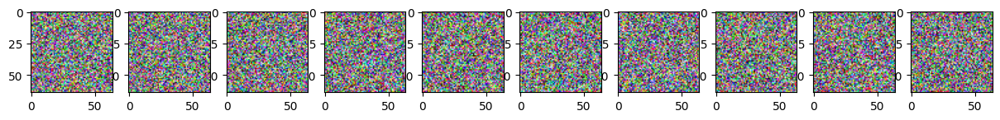

Epoch 5 | step 000 Loss: 0.15204297006130219 


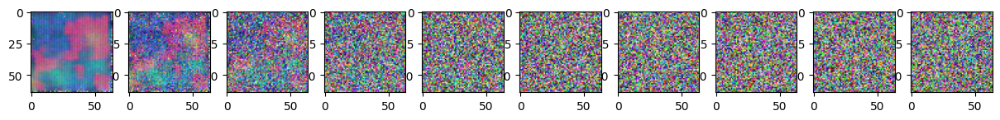

Epoch 10 | step 000 Loss: 0.11765909194946289 


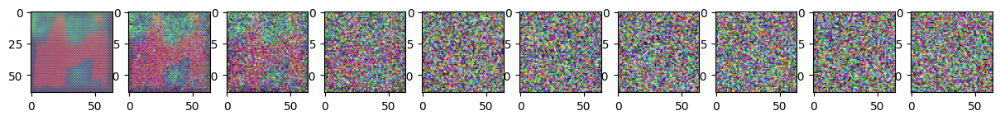

Epoch 15 | step 000 Loss: 0.11573298275470734 


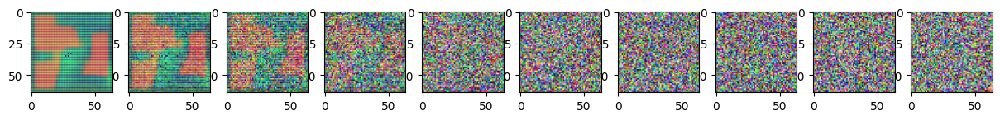

Epoch 20 | step 000 Loss: 0.1016049012541771 


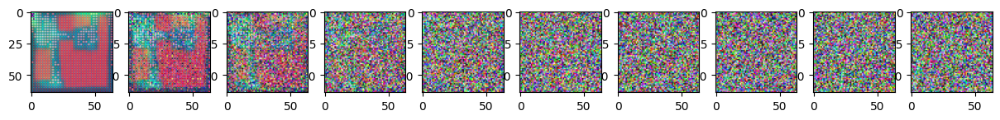

Epoch 25 | step 000 Loss: 0.09014367312192917 


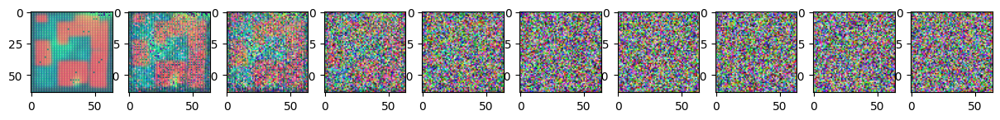

Epoch 30 | step 000 Loss: 0.0886269062757492 


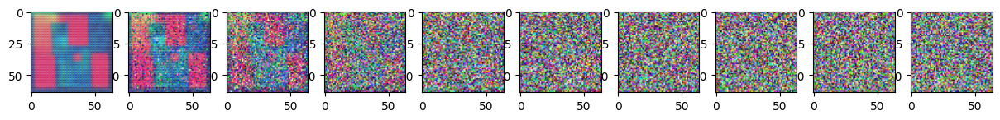

Epoch 35 | step 000 Loss: 0.0874878466129303 


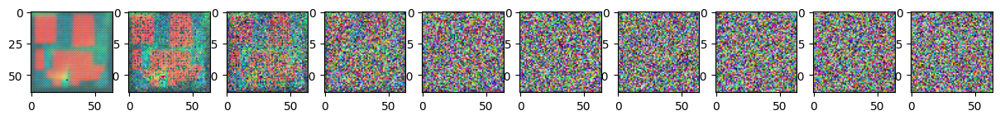

Epoch 40 | step 000 Loss: 0.08956285566091537 


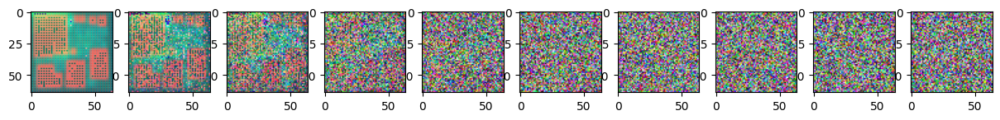

Epoch 45 | step 000 Loss: 0.08339083194732666 


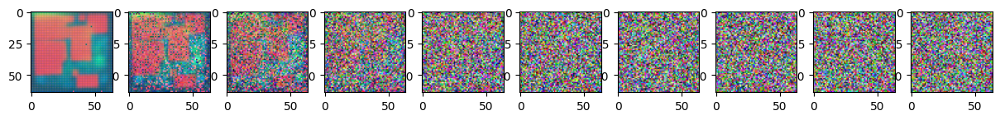

Epoch 50 | step 000 Loss: 0.08063861727714539 


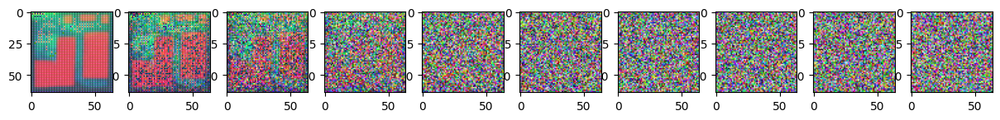

Epoch 55 | step 000 Loss: 0.07369934022426605 


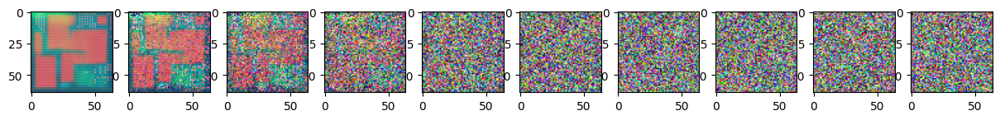

Epoch 60 | step 000 Loss: 0.07294270396232605 


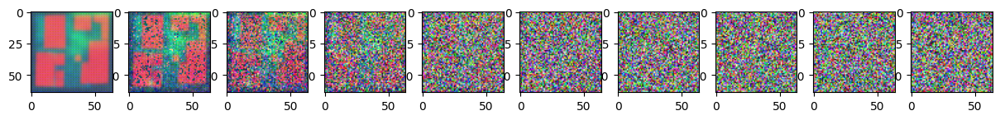

Epoch 65 | step 000 Loss: 0.07079191505908966 


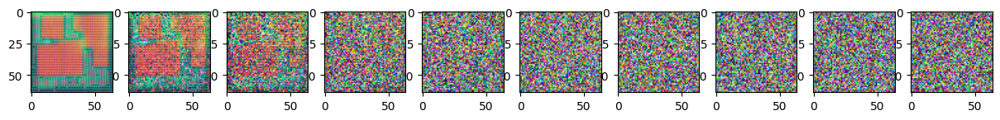

Epoch 70 | step 000 Loss: 0.060028307139873505 


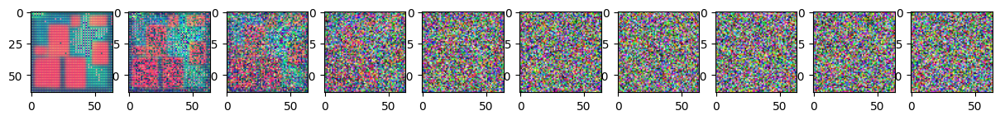

Epoch 75 | step 000 Loss: 0.08840958774089813 


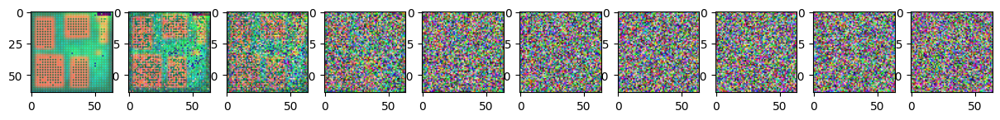

Epoch 80 | step 000 Loss: 0.07758089154958725 


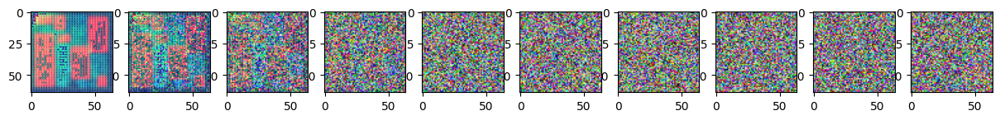

Epoch 85 | step 000 Loss: 0.06850561499595642 


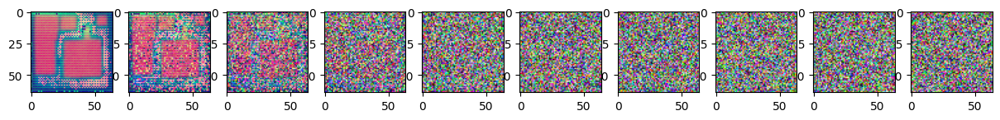

Epoch 90 | step 000 Loss: 0.07054297626018524 


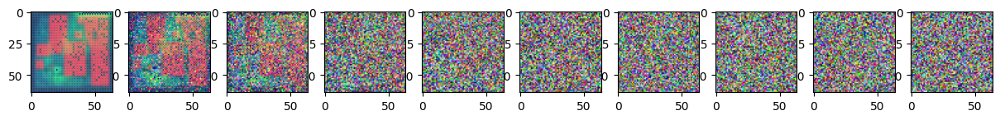

Epoch 95 | step 000 Loss: 0.06268449872732162 


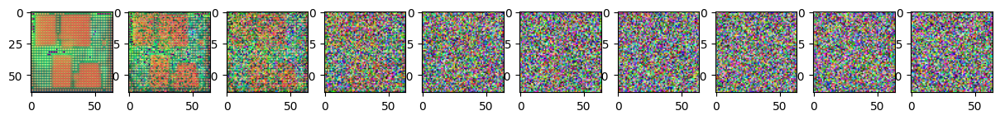

Epoch 100 | step 000 Loss: 0.06339584290981293 


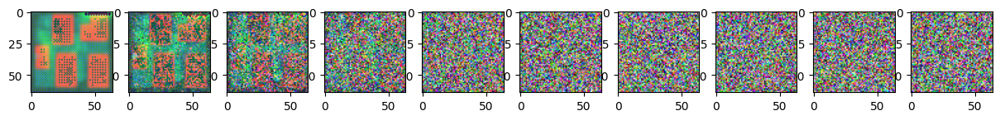

Epoch 105 | step 000 Loss: 0.06304796785116196 


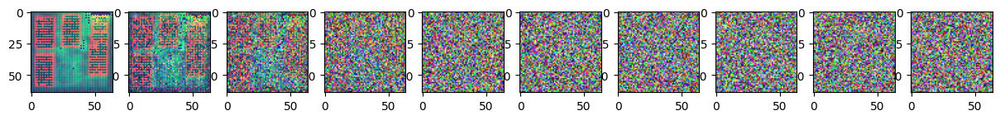

Epoch 110 | step 000 Loss: 0.06066956743597984 


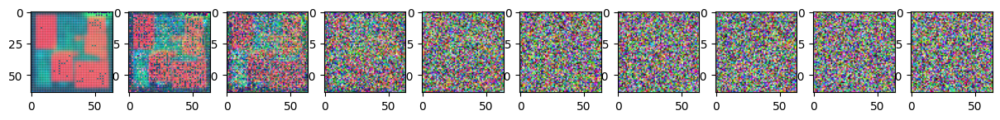

Epoch 115 | step 000 Loss: 0.06412117183208466 


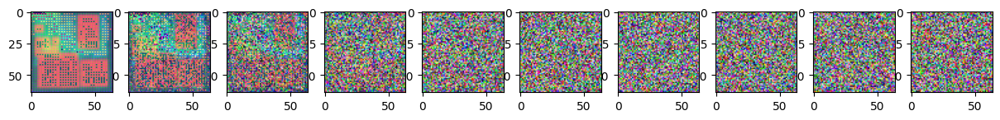

Epoch 120 | step 000 Loss: 0.07475226372480392 


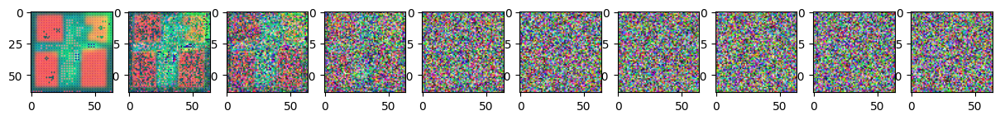

Epoch 125 | step 000 Loss: 0.06812909990549088 


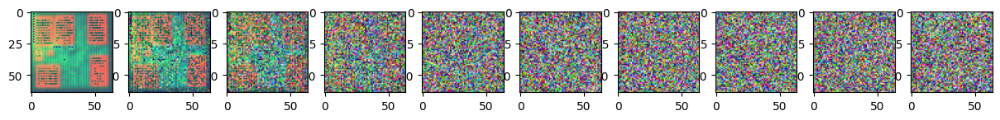

Epoch 130 | step 000 Loss: 0.06464884430170059 


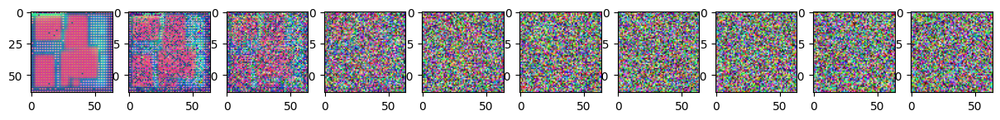

Epoch 135 | step 000 Loss: 0.057666778564453125 


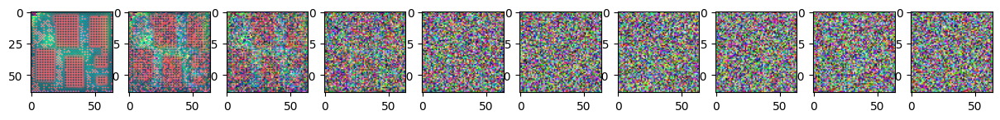

Epoch 140 | step 000 Loss: 0.06450506299734116 


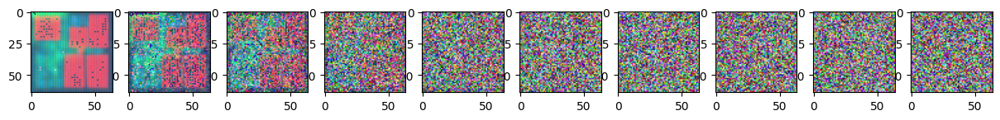

Epoch 145 | step 000 Loss: 0.06228654831647873 


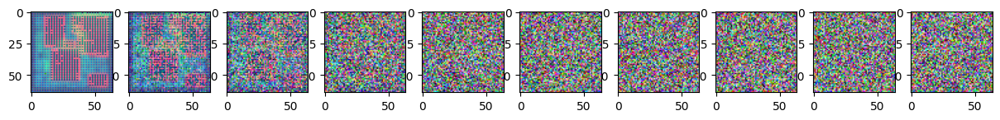

Epoch 150 | step 000 Loss: 0.06417034566402435 


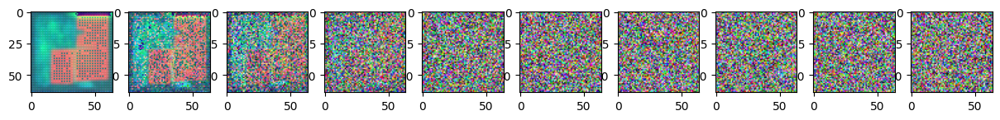

Epoch 155 | step 000 Loss: 0.07807449996471405 


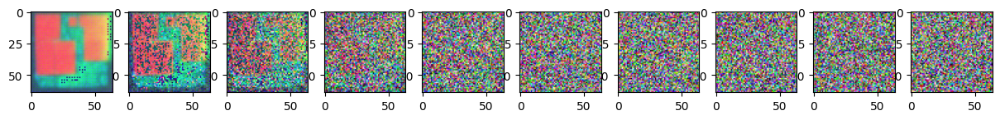

Epoch 160 | step 000 Loss: 0.05937287211418152 


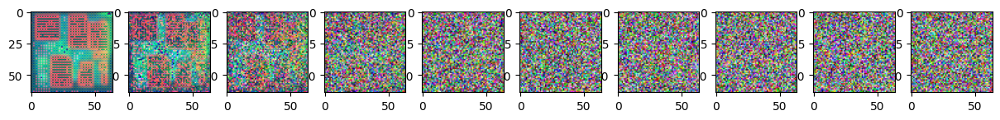

Epoch 165 | step 000 Loss: 0.06053701788187027 


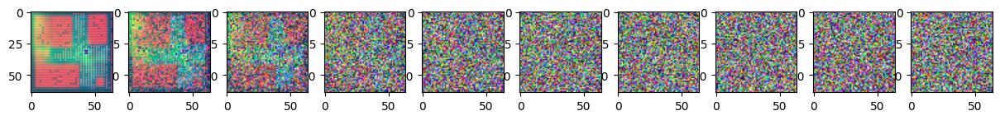

Epoch 170 | step 000 Loss: 0.061408013105392456 


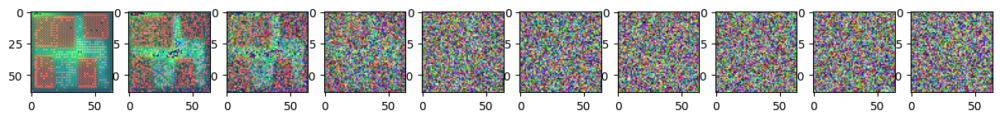

Epoch 175 | step 000 Loss: 0.05412814021110535 


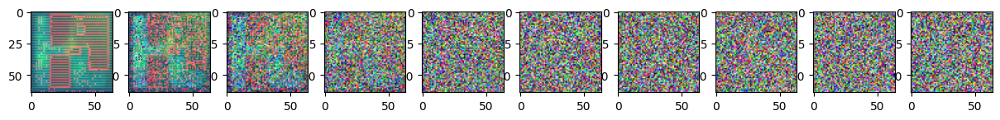

Epoch 180 | step 000 Loss: 0.05574537441134453 


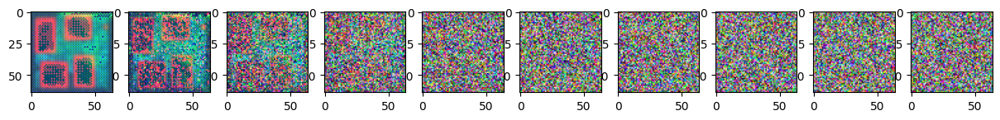

Epoch 185 | step 000 Loss: 0.06953589618206024 


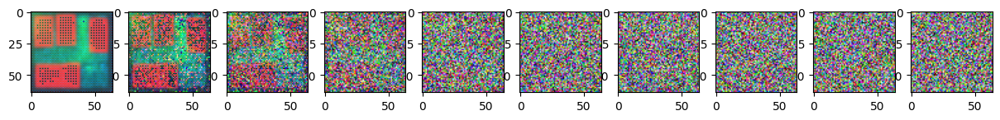

Epoch 190 | step 000 Loss: 0.06192437931895256 


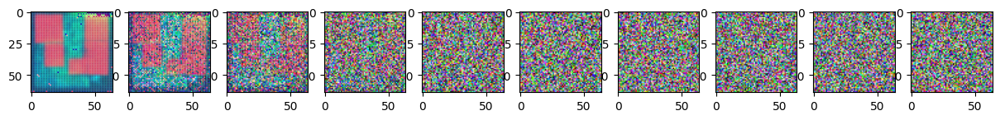

Epoch 195 | step 000 Loss: 0.0621301643550396 


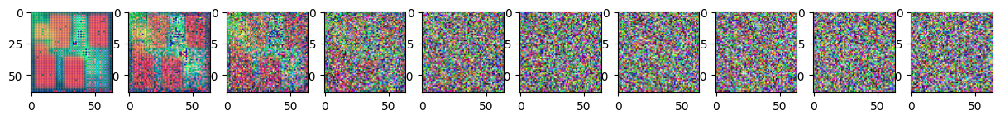

In [9]:
from torch.optim import Adam

device = "cuda" if torch.cuda.is_available() else "cpu"
model.to(device)
optimizer = Adam(model.parameters(), lr=0.001)
epochs = 200 # 

for epoch in range(epochs):
    for step, batch in enumerate(dataloader):
      optimizer.zero_grad()

      t = torch.randint(0, T, (BATCH_SIZE,), device=device).long()
      loss = get_loss(model, batch, t)
      loss.backward()
      optimizer.step()

      if epoch % 5 == 0 and step == 0:
        print(f"Epoch {epoch} | step {step:03d} Loss: {loss.item()} ")
        sample_plot_image()
        

# Experimental setup 
We pre-processed the feature maps into jpg images, then fed them into our simple diffusion model. Corresponding to 300 and 600 diffusion steps, we tested 100 epochs, 200 epochs, and 500 epochs, respectively. 


# Results

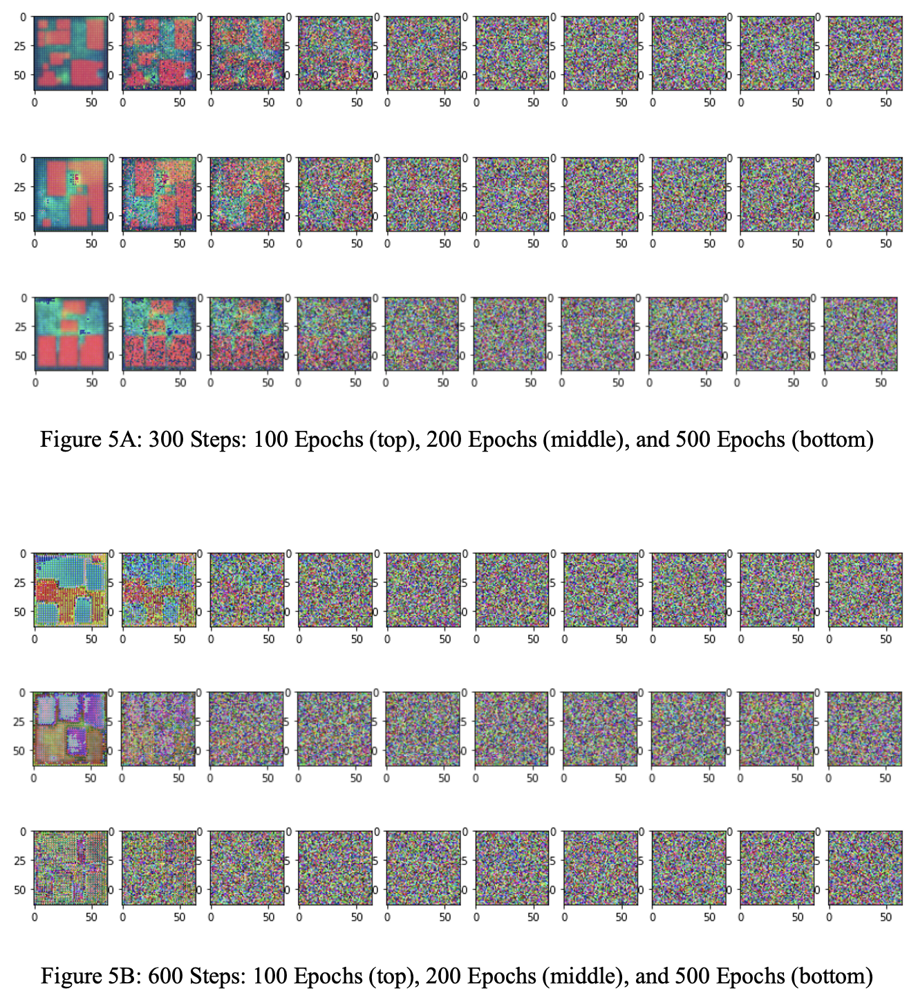

# Conclusion

The results show that diffusion models can capture VLSI design features, as shown in Figure 5A. When the timestep was set to 300, the results produced in all three runs resembled the input feature visualization shown in Figure 3. However, the differences among these outputs were insignificant even though 500 epochs are much more than 100 epochs. It should be because the model only has some essential components of U-net architecture. Improvements can be made by adding group normalization, attention, learned variance, etc.

In Figure 5B, when we set the timestep to 600, we can see that almost all of them were significantly off from the visualization of the input design features. These results validate what we mentioned earlier: the linear schedule destroys the information too fast, and images become so uninformative that the network cannot recover them. Improvements can be made by adapting a cosine schedule or simply reducing the steps as we did in our experiments.

# Limitations

The most prominent limitation of this research is that when our diffusion model generates routfriendly design features, we need to ensure we can implement the output features without messing up other design features that are not included in our input, as those VLSI design features are mostly strictly dependent on each other. For example, as mentioned earlier, RUDY has assumptions about other specifications. One possible solution to overcome this limitation is integrating all dependent features into our data input.

# Bibliography
     
[1]	C. C. Huang et al., “NTU place4dr: A Detailed-Routing-Driven Placer for Mixed-Size Circuit Designs with Technology and Region Constraints,” IEEE Trans. Comput. Des. Integr. Circuits Syst., vol. 37, no. 3, pp. 669–681, Mar. 2018, doi: 10.1109/TCAD.2017.2712665.
[2]	A. Kennings, N. K. Darav, and L. Behjat, “Detailed placement accounting for technology constraints,” IEEE/IFIP Int. Conf. VLSI Syst. VLSI-SoC, vol. 2015-January, no. January, Jan. 2015, doi: 10.1109/VLSI-SOC.2014.7004188.
[3]	S. Chou, M. K. Hsu, and Y. W. Chang, “Structure-aware placement for datapath-intensive circuit designs,” Proc. - Des. Autom. Conf., pp. 762–767, 2012, doi: 10.1145/2228360.2228498.
[4]	“Refine Placement (Legalization) & Detailed Placement in VLSI Physical Design.” https://ivlsi.com/refine-placement-detailed-placement-vlsi-physical-design/ (accessed Jan. 20, 2023).
[5]	C.-K. Cheng, A. B. Kahng, I. Kang, and L. Wang, “RePlAce: Advancing Solution Quality and Routability Validation in Global Placement; RePlAce: Advancing Solution Quality and Routability Validation in Global Placement,” 2018, doi: 10.1109/TCAD.2018.2859220.
[6]	S. Liu, Q. Sun, P. Liao, Y. Lin, and B. Yu, “Global Placement with Deep Learning-Enabled Explicit Routability Optimization,” Proc. -Design, Autom. Test Eur. DATE, vol. 2021-February, pp. 1821–1824, Feb. 2021, doi: 10.23919/DATE51398.2021.9473959.
[7]	Z. Chai, Y. Zhao, Y. Lin, W. Liu, R. Wang, and R. Huang, “CircuitNet: An Open-Source Dataset for Machine Learning Applications in Electronic Design Automation (EDA),” Sci. China Inf. Sci., vol. 65, no. 12, p. 227401, Jul. 2022, doi: 10.1007/s11432-022-3571-8.
[8]	J. Ho, A. Jain, and P. Abbeel, “Denoising Diffusion Probabilistic Models,” Adv. Neural Inf. Process. Syst., vol. 2020-December, Jun. 2020, doi: 10.48550/arxiv.2006.11239.
[9]	P. Dhariwal and A. Nichol, “Diffusion Models Beat GANs on Image Synthesis,” Adv. Neural Inf. Process. Syst., vol. 11, pp. 8780–8794, May 2021, doi: 10.48550/arxiv.2105.05233.
[10]	“diffusion_model.ipynb - Colaboratory.” https://colab.research.google.com/drive/1sjy9odlSSy0RBVgMTgP7s99NXsqglsUL?usp=sharing#scrollTo=HhIgGq3za0yh (accessed Jan. 24, 2023).
[11]	“lucidrains/denoising-diffusion-pytorch: Implementation of Denoising Diffusion Probabilistic Model in Pytorch.” https://github.com/lucidrains/denoising-diffusion-pytorch (accessed Jan. 26, 2023).
[12]	“annotated-diffusion.ipynb - Colaboratory.” https://colab.research.google.com/github/huggingface/notebooks/blob/main/examples/annotated_diffusion.ipynb#scrollTo=3a159023 (accessed Jan. 26, 2023).
[13]	“Improving Diffusion Models as an Alternative To GANs, Part 1 | NVIDIA Technical Blog.” https://developer.nvidia.com/blog/improving-diffusion-models-as-an-alternative-to-gans-part-1/ (accessed Jan. 25, 2023).
[14]	J. Sohl-Dickstein, E. A. Weiss, N. Maheswaranathan, and S. Ganguli, “Deep Unsupervised Learning using Nonequilibrium Thermodynamics,” 32nd Int. Conf. Mach. Learn. ICML 2015, vol. 3, pp. 2246–2255, Mar. 2015, doi: 10.48550/arxiv.1503.03585.
[15]	A. Nichol and P. Dhariwal, “Improved Denoising Diffusion Probabilistic Models,” Feb. 2021, doi: 10.48550/arxiv.2102.09672.
[16]	E. Shelhamer, J. Long, and T. Darrell, “Fully Convolutional Networks for Semantic Segmentation,” IEEE Trans. Pattern Anal. Mach. Intell., vol. 39, no. 4, pp. 640–651, Nov. 2014, doi: 10.48550/arxiv.1411.4038.
[17]	W. Weng and X. Zhu, “U-Net: Convolutional Networks for Biomedical Image Segmentation,” IEEE Access, vol. 9, pp. 16591–16603, May 2015, doi: 10.48550/arxiv.1505.04597.
[18]	A. Jolicoeur-Martineau, R. Piché-Taillefer, I. Mitliagkas, R. Tachet, and D. Combes, “Adversarial score matching and improved sampling for image generation,” Sep. 2020, doi: 10.48550/arxiv.2009.05475.
[19]	A. Vaswani et al., “Attention Is All You Need,” Adv. Neural Inf. Process. Syst., vol. 2017-December, pp. 5999–6009, Jun. 2017, doi: 10.48550/arxiv.1706.03762.
[20]	P. Spindler and F. M. Johannes, “Fast and Accurate Routing Demand Estimation for Efficient Routability-driven Placement,” 2007.
